In [35]:
using Plots
function metric(x1,y1,x2,y2)
    return sqrt((x1-x2)^2 + (y1-y2)^2)
end

Nx = 1000
Ny =300
q = 9
τ=0.86 #Since we take dt to be 1 over this code, so τ>1/2 is a stability condition for overrelxation.
Nt = 4000
u0 = 0.1
TimeScale=3
cx = [0,0,1,1,1,0,-1,-1,-1]
cy = [0,1,1,0,-1,-1,-1,0,1]
w = [4/9,1/9,1/36,1/9,1/36,1/9,1/36,1/9,1/36]
Re = u0*Ny/τ


34.883720930232556

In [36]:
function stream(f)
    for i=1:q
        f[:,:,i] = circshift(f[:,:,i],(cx[i],0))
        f[:,:,i] = circshift(f[:,:,i],(0,cy[i]))
    end
    return f
end
function macroscopic(f)
    ρ = reshape(sum(f,dims=3),Nx,Ny)
    ux = reshape(sum(f[:,:,i] * cx[i] for i in 1:q)./ρ,Nx,Ny)
    uy = reshape(sum(f[:,:,i] * cy[i] for i in 1:q)./ρ,Nx,Ny)
    return ρ,ux,uy
end
function InitialConditions(u0)
    f= zeros(Nx,Ny,q)
    ux = zeros(Nx,Ny)
    uy = zeros(Nx,Ny)
    ρ = ones(Nx,Ny)
    for i = 2:Ny-1
        ux[1,i] = u0
    end
    return f,ρ,ux,uy
end
function collide(f,ρ,ux,uy)
    feq = zeros(Nx,Ny,q)
    for i in 1:q
        feq[:,:,i] =   w[i] *ρ .* ( 3*(cx[i]*ux+cy[i]*uy)+9/2*(cx[i]*ux+cy[i]*uy).^2- 3*(ux.^2 + uy.^2)/2 .+1.0)
    end
    f = f - (f - feq)/τ
    return f
end

function object(f,ux,uy,cylinder)
    boundary = f[cylinder,:]
    boundary = boundary[:,[1,6,7,8,9,2,3,4,5]]
    ux[cylinder] .= 0
    uy[cylinder] .= 0
    f[cylinder,:] = boundary
    return f,ux,uy
end

function BoundaryConditions(f,ux,uy,u0)
    #Right boundary
    f[Nx,:,8] = f[Nx-1,:,8]
    f[Nx,:,7] = f[Nx-1,:,7]
    f[Nx,:,9] = f[Nx-1,:,9]

    #bottom and top
    f[:,1,2] = f[:,1,6]
    f[:,1,3] = f[:,1,7]
    f[:,1,9] = f[:,1,5]
    f[:,Ny,6] = f[:,Ny,2]
    f[:,Ny,7] = f[:,Ny,3]
    f[:,Ny,5] = f[:,Ny,9]
    ux[:,1] .= 0
    ux[:,Ny] .= 0
    uy[:,1] .= 0
    uy[:,Ny] .= 0

    #Left boundary
    for j = 2:Ny-1
        f[1,j,4] = f[1,j,8] + 2*ρ[1,j]*u0/3
        f[1,j,3] = f[1,j,7] - 0.5*(f[1,j,2]-f[1,j,6])+ρ[1,j]*u0/6
        f[1,j,5] = f[1,j,9] + 0.5*(f[1,j,2]-f[1,j,6])+ρ[1,j]*u0/6
        ux[1,j] = u0
        uy[1,j] = 0
    end
    return f,ux,uy
end


BoundaryConditions (generic function with 1 method)

In [38]:
cylinder = BitArray(metric(i,j,Nx/4,Ny/2) < Ny/4 for i in 1:Nx, j in 1:Ny)
strength = zeros(Nx,Ny,Nt)
vorticity = zeros(Nx,Ny,Nt)
f,ρ,ux,uy = InitialConditions(u0)
for j=1:TimeScale*Nt
    #stream
    f = collide(f,ρ,ux,uy)
    f = stream(f)
    f,ux,uy = object(f,ux,uy,cylinder)
    f,ux,uy = BoundaryConditions(f,ux,uy,u0)
    #macroscopic
    ρ,ux,uy= macroscopic(f)
    if j%TimeScale == 0
        strength[:,:,Int(j/TimeScale)] = sqrt.(ux.^2 + uy.^2)
        vorticity[:,:,Int(j/TimeScale)] =(circshift(ux[:,:], (-1,0)) - circshift(ux[:,:], (1,0))) - (circshift(uy[:,:], (0,-1)) - circshift(uy[:,:], (0,1)))

    end
end


┌ Info: Saved animation to c:\Users\batti\Documents\Uni\ComputationalProjects\Julia\LatticeBoltzmann\Cylinder\Velocity.gif
└ @ Plots C:\Users\batti\.julia\packages\Plots\kLeqV\src\animation.jl:156


Plots.AnimatedGif("c:\\Users\\batti\\Documents\\Uni\\ComputationalProjects\\Julia\\LatticeBoltzmann\\Cylinder\\Velocity.gif")
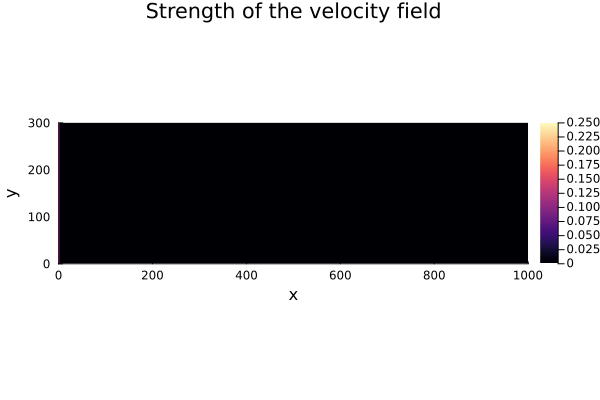

In [39]:
VelocityAnim = @animate for i=1:(Nt-700)
    heatmap(transpose(strength[:,:,i]),aspect_ratio=1,color=:magma, clim=(0,0.25),xlim=(0,Nx),ylim=(0,Ny),xlabel="x",ylabel="y",title="Strength of the velocity field")
end every 10
gif(VelocityAnim, "Velocity.gif", fps = 15)

┌ Info: Saved animation to c:\Users\batti\Documents\Uni\ComputationalProjects\Julia\LatticeBoltzmann\Cylinder\Vorticity.gif
└ @ Plots C:\Users\batti\.julia\packages\Plots\kLeqV\src\animation.jl:156


Plots.AnimatedGif("c:\\Users\\batti\\Documents\\Uni\\ComputationalProjects\\Julia\\LatticeBoltzmann\\Cylinder\\Vorticity.gif")
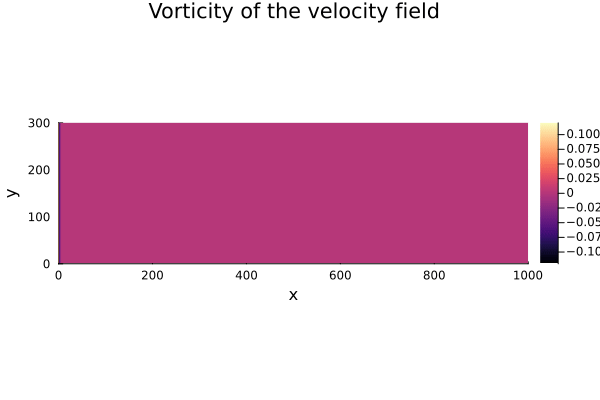

In [40]:
VortexAnim = @animate for i=1:(Nt-700)
    heatmap(transpose(vorticity[:,:,i]),aspect_ratio=1,color=:magma, clim=(-0.12,0.12),xlim=(0,Nx),ylim=(0,Ny),xlabel="x",ylabel="y",title="Vorticity of the velocity field")
end every 10
gif(VortexAnim, "Vorticity.gif", fps = 15)